# Exploración de datos

In [4]:
import sys
import os
from functools import reduce

project_path = os.path.abspath('..')
sys.path.insert(1, project_path)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from src.utils import get_project_root
from src.data.make_dataset import get_minma_data

Para una exploración inicial de los datos, se utilizarán datos desde 5 años atrás de las siguientes variables presentes en ambas estaciones:
- SO2
- NO2
- NO
- NOX
- O3
- CO
- Dirección del viento
- Velocidad del viento

NORMA: ANUAL 80 microgramos /metrocubico
24H: 365 microgramos/metrocubico

In [5]:
params = ['SO2','NO2', 'NO', 'NOX', 'O3', 'CO']
from_last = '5y'

## ConCon

In [6]:
concon_df = get_minma_data(params, 'concon', from_last=from_last)
concon_df.head()

c:\users\nicol\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  """Entry point for launching an IPython kernel.


,Registros validados_SO2,Registros preliminares_SO2,Registros no validados_SO2,Registros validados_NO2,Registros preliminares_NO2,Registros no validados_NO2,Registros validados_NO,Registros preliminares_NO,Registros no validados_NO,Registros validados_NOX,Registros preliminares_NOX,Registros no validados_NOX,Registros validados_O3,Registros preliminares_O3,Registros no validados_O3,Registros validados_CO,Registros preliminares_CO,Registros no validados_CO
2017-09-27 18:00:00,NaN,NaN,1.32,NaN,NaN,9.01,NaN,NaN,7.99708,NaN,NaN,17.00820,NaN,NaN,22.0,NaN,NaN,0.66
2017-09-27 19:00:00,NaN,NaN,1.19,NaN,NaN,8.25,NaN,NaN,7.47957,NaN,NaN,15.72780,NaN,NaN,22.0,NaN,NaN,0.52
2017-09-27 20:00:00,NaN,NaN,1.21,NaN,NaN,6.56,NaN,NaN,5.00489,NaN,NaN,11.56530,NaN,NaN,23.0,NaN,NaN,0.56
2017-09-27 21:00:00,NaN,NaN,1.45,NaN,NaN,6.26,NaN,NaN,3.48237,NaN,NaN,9.73781,NaN,NaN,24.0,NaN,NaN,0.49
2017-09-27 22:00:00,NaN,NaN,4.04,NaN,NaN,4.97,NaN,NaN,3.07353,NaN,NaN,8.04764,NaN,NaN,25.0,NaN,NaN,0.48


In [7]:
concon_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43830 entries, 2017-09-27 18:00:00 to 2022-09-27 23:00:00
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Registros validados_SO2     0 non-null      float64
 1   Registros preliminares_SO2  0 non-null      float64
 2   Registros no validados_SO2  43317 non-null  float64
 3   Registros validados_NO2     0 non-null      float64
 4   Registros preliminares_NO2  0 non-null      float64
 5   Registros no validados_NO2  42836 non-null  float64
 6   Registros validados_NO      0 non-null      float64
 7   Registros preliminares_NO   0 non-null      float64
 8   Registros no validados_NO   42822 non-null  float64
 9   Registros validados_NOX     0 non-null      float64
 10  Registros preliminares_NOX  0 non-null      float64
 11  Registros no validados_NOX  42835 non-null  float64
 12  Registros validados_O3      0 non-null      float64
 

Se observa que de las columnas, las únicas que poseen datos son aquellas que tienen datos preliminares, por lo que el resto se descartará

In [8]:
cols_to_drop = list(concon_df.filter(regex='(?<!no validados)_.*')) 
concon_df = concon_df.drop(cols_to_drop, axis=1)

Valores nulos

In [9]:
concon_df.isna().sum()

Registros no validados_SO2     513
Registros no validados_NO2     994
Registros no validados_NO     1008
Registros no validados_NOX     995
Registros no validados_O3      436
Registros no validados_CO      536
dtype: int64

Resumen estadístico

In [10]:
concon_df.describe()

,Registros no validados_SO2,Registros no validados_NO2,Registros no validados_NO,Registros no validados_NOX,Registros no validados_O3,Registros no validados_CO
count,43317.000000,42836.000000,42822.000000,42835.000000,43394.000000,43294.000000
mean,6.712286,10.341681,9.210566,19.550313,21.128520,0.533484
std,8.855791,6.470814,9.385323,14.015716,10.208201,0.204782
min,0.030000,0.510000,0.000000,1.678980,1.000000,0.020000
25%,2.620000,5.620000,3.837060,10.475850,14.000000,0.390000
50%,3.690000,8.880000,6.221650,15.298800,21.000000,0.500000
75%,6.920000,13.650000,10.609375,23.921900,28.000000,0.630000
max,263.920000,151.620000,147.097000,215.075000,154.000000,4.360000


Histogramas

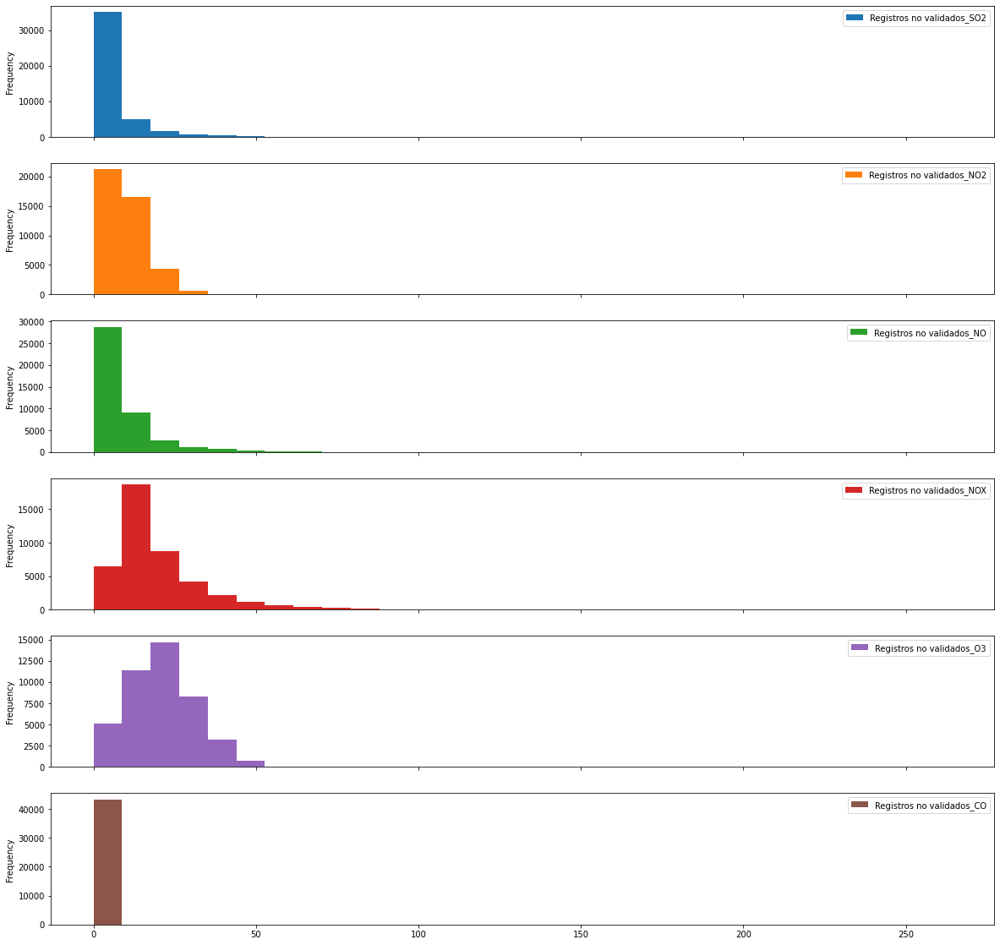

In [11]:
concon_df.plot.hist(subplots=True, figsize=(20,20), bins=30)
plt.show()

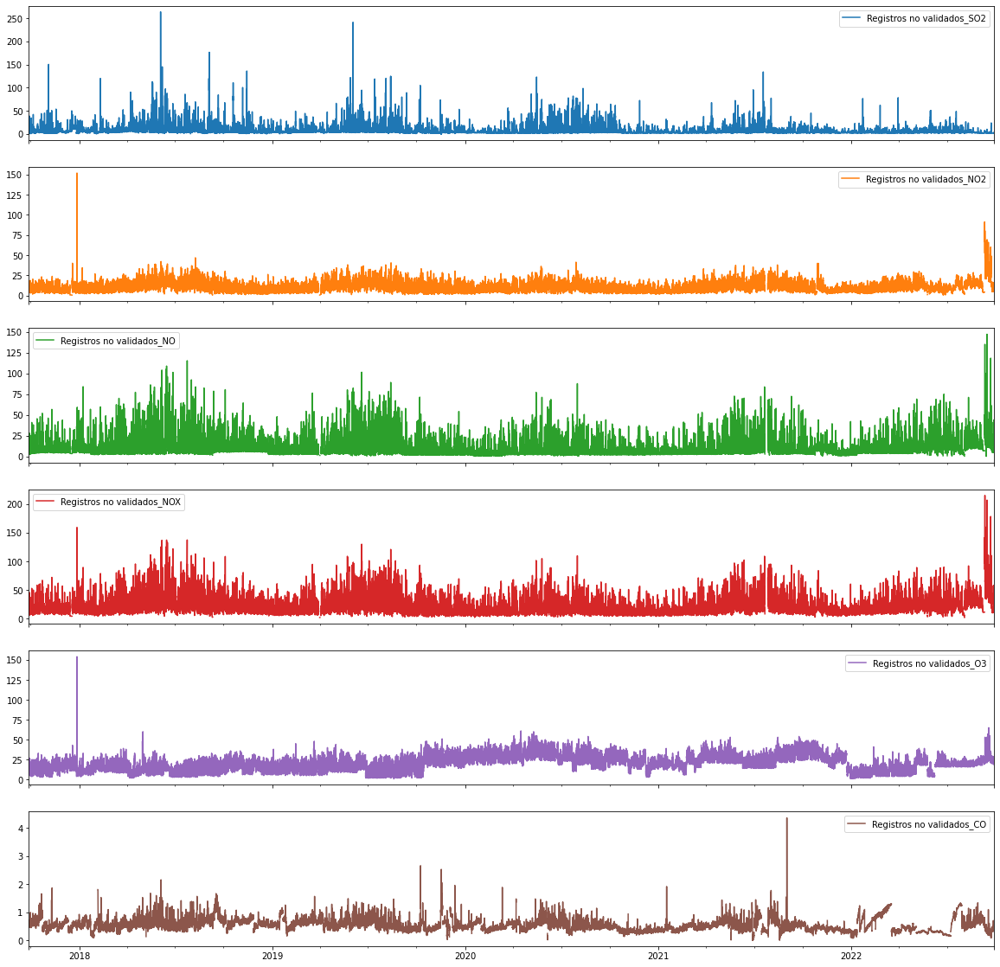

In [12]:
concon_df.plot(subplots=True, figsize=(20,20))
plt.show()

In [13]:
def ver_ultima_semana(df, dias_antes = 0):
    df_lw = df.iloc[(-24*dias_antes-168 -1):(-24*dias_antes-1)].interpolate()
    df_lw.plot(subplots=True, figsize=(20,20))
    plt.show()
    return df_lw
    
def ver_ultimo_ano(df, anos = 1, meses_antes = 0):
    df_lw = df.iloc[(-24*30*meses_antes-24*365*anos -1):(-24*30*meses_antes-1)].interpolate()
    df_lw.plot(subplots=True, figsize=(20,20))
    plt.show()
    return df_lw

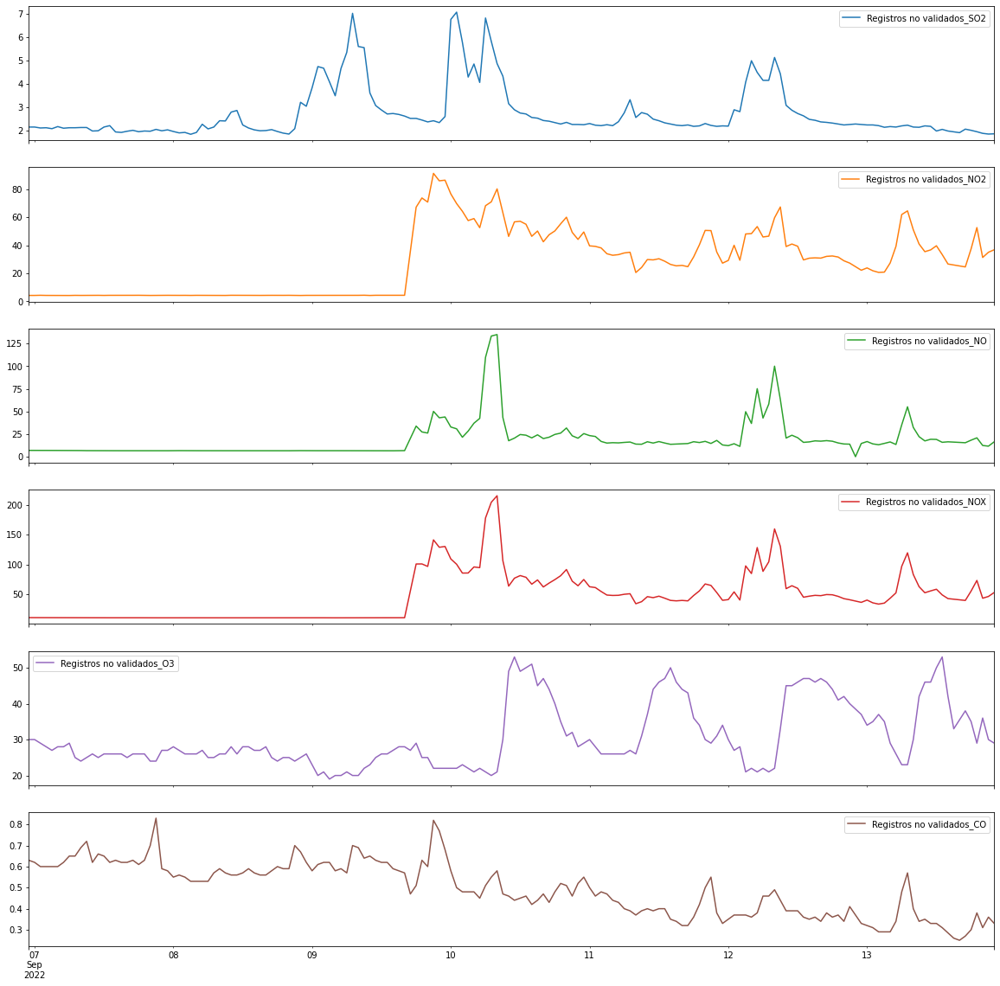

,Registros no validados_SO2,Registros no validados_NO2,Registros no validados_NO,Registros no validados_NOX,Registros no validados_O3,Registros no validados_CO
2022-09-06 23:00:00,2.16,4.20,6.95817,11.1612,30.0,0.63
2022-09-07 00:00:00,2.16,4.21,6.92174,11.1343,30.0,0.62
2022-09-07 01:00:00,2.12,4.31,6.81288,11.1247,29.0,0.60
2022-09-07 02:00:00,2.13,4.22,6.91427,11.1298,28.0,0.60
2022-09-07 03:00:00,2.09,4.21,6.94955,11.1643,27.0,0.60
...,...,...,...,...,...,...
2022-09-13 18:00:00,2.02,37.40,18.25400,55.6523,35.0,0.30
2022-09-13 19:00:00,1.96,52.57,20.81670,73.3838,29.0,0.38
2022-09-13 20:00:00,1.89,31.26,12.39000,43.6475,36.0,0.31
2022-09-13 21:00:00,1.86,34.98,11.62030,46.6050,30.0,0.36


In [14]:
ver_ultima_semana(concon_df, dias_antes = 14)

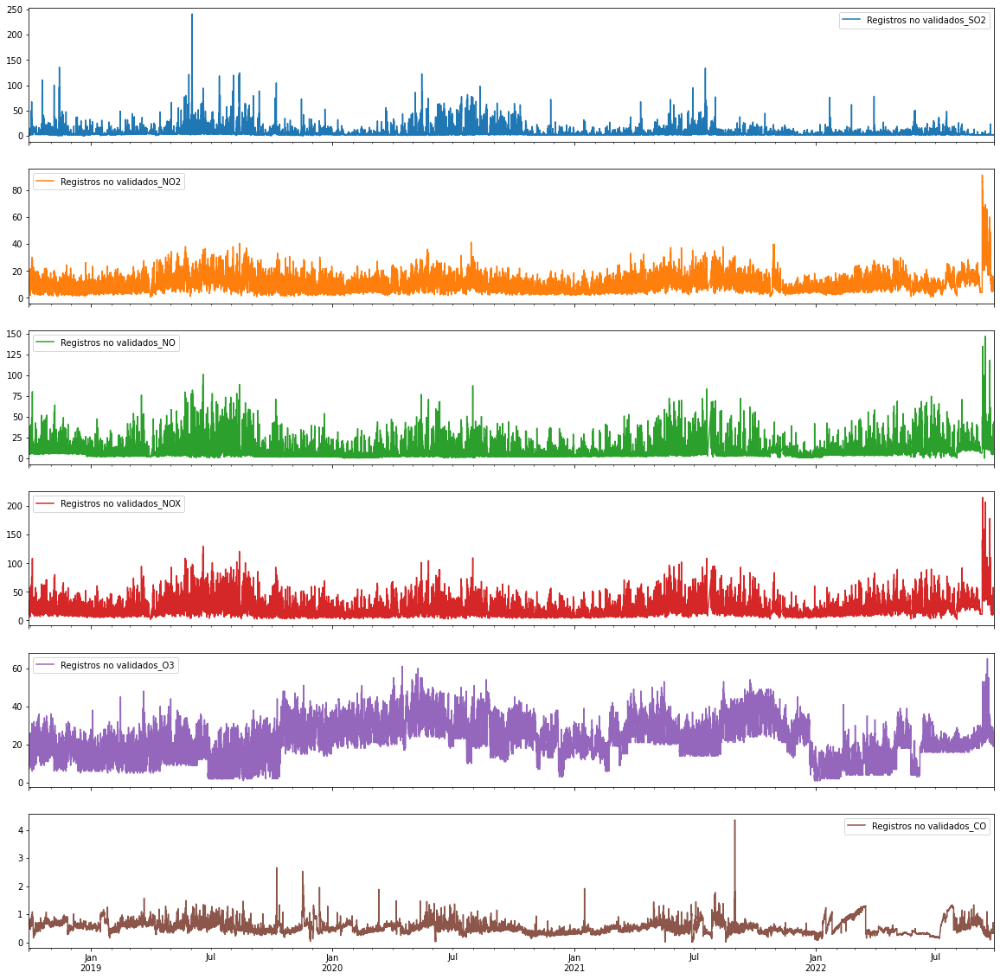

In [15]:
df_2anos = ver_ultimo_ano(concon_df, anos = 4)

In [16]:
#df_2anos = ver_ultimo_ano(concon_df, anos = 2)
#df_2anos["day"] = df_2anos.index.day
#df_2anos["month"] = df_2anos.index.month
#df_2anos.groupby(["day", "month"]).mean()

Visualización basada en:
https://github.com/KishManani/MSTL/blob/main/mstl_decomposition.ipynb

In [17]:
import seaborn as sns
from scipy.stats import circmean

In [18]:
def plot_por_mes(timeseries, col, log = False, circular = False):
    # Plot the electricity demand for each day
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=[15, 10], sharey=True)
    ax = ax.flatten()
    sns_blue = sns.color_palette(as_cmap=True)[0]
    MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun"]
    for ix, month in enumerate(MONTHS):

        # Plot individual ts
        daily_ts = []
        for _, ts in (
            timeseries[[col, "day_of_month", "month"]]
            .query(f"month == {ix+1}")
            .groupby("day_of_month")
        ):
            daily_ts.append(ts.reset_index()[col])
            ts.reset_index()[col].plot(
                alpha=0.1, ax=ax[ix], color=sns_blue, label="_no_legend_"
            )
            ax[ix].set_xticks(np.arange(0, len(ts) + 1, 8))
            ax[ix].set_title(month)

        # Plot the mean ts
        if not circular:
            pd.concat(daily_ts, axis=1).mean(axis=1).plot(
                ax=ax[ix], color="blue", label="mean", legend=True
            )
        else:
            pd.concat(daily_ts, axis=1).apply(lambda x: circmean(x),axis=1).plot(
                ax=ax[ix], color="blue", label="mean", legend=True
            )
        ax[ix].legend(loc="upper left", frameon=False)
        if log:
            ax[ix].set_yscale('log')

        if month in ("Jan", "Feb"):
            ax[ix].tick_params(
                axis="x", which="both", bottom=False, top=False, labelbottom=False
            )

    fig.text(0.5, -0.02, "Hora del día", ha="center")
    fig.text(-0.02, 0.5, "Concentración", va="center", rotation="vertical")
    fig.suptitle("Emisiones de {} medidas cada día según el mes, en la estación Con Cón".format(col))
    #fig.delaxes(ax[-1])
    fig.tight_layout()
    plt.show()

def plot_por_semana(timeseries, col, log = False, circular = False):
    fig, ax = plt.subplots(figsize=[20, 10])
    weekly_ts = []
    sns_blue = sns.color_palette(as_cmap=True)
    DAYS = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
    for week, ts in timeseries.groupby("week"):
        weekly_ts.append(ts.reset_index()[col])
        ts.reset_index()[col].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
        plt.xticks(ticks=np.arange(0, 167, 24), labels=DAYS)

    pd.concat(weekly_ts, axis=1).mean(axis=1).plot(
        ax=ax, color="blue", label="mean", legend=True
    )

    ax.set_ylabel("Concentración")
    ax.set_title("Emisiones de {} medidas cada día de la semana en la estación ConCon".format(col))
    ax.set_xlabel("Día de la semana")
    if log:
            ax.set_yscale('log')
    ax.legend(loc="upper right", frameon=False)

    plt.tight_layout()
    plt.show()
    
def plot_por_ano(timeseries, col, circular = False):
    fig, ax = plt.subplots(figsize=[20, 10])
    yearly_ts = []
    sns_blue = sns.color_palette(as_cmap=True)
    MONTHS = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    for month, ts in timeseries.groupby("year"):
        ts = ts.groupby(["month","day_of_month"]).mean()
        #print(ts.reset_index())
        yearly_ts.append(ts.reset_index()[col])
        ts.reset_index()[col].plot(alpha=0.1, ax=ax, label="_no_legend_", color=sns_blue)
        plt.xticks(ticks= [0, 31, 59, 90, 120, 151, 181, 212, 242, 273, 303, 334], labels=MONTHS)

    pd.concat(yearly_ts, axis=1).mean(axis=1).plot(
        ax=ax, color="blue", label="mean", legend=True
    )

    ax.set_ylabel("Concentración")
    ax.set_title("Emisiones de {} medidas cada mes en la estación ConCon".format(col))
    ax.set_xlabel("Mes")
    ax.legend(loc="upper right", frameon=False)

    plt.tight_layout()
    plt.show()
    
def visualizar_trends(df, col = "SO2", ano_0 = 2021, log = False, circular = False):
    timeseries = df
    timeseries['Fecha'] = timeseries.index
    timeseries = timeseries.rename(columns={"Registros no validados_SO2": "SO2", "Registros no validados_NO2": "NO2", "Registros no validados_NO": "NO", "Registros no validados_NOX": "NOX", "Registros no validados_O3": "O3", "Registros no validados_CO": "CO"})
    
    # Filter for first 149 days of 2021.
    start_date = pd.to_datetime("{}-01-01".format(ano_0))
    end_date = start_date + pd.Timedelta("180D")
    mask = (timeseries["Fecha"] >= start_date) & (timeseries["Fecha"] < end_date)
    #mask = (timeseries.index >= start_date) & (timeseries.index < end_date)
    #timeseries_full = timeseries
    
    # Resample to hourly
    
    # Compute date time variables used later in plotting
    timeseries["week"] = timeseries.index.isocalendar().week
    timeseries["day_of_month"] = timeseries.index.day
    timeseries["month"] = timeseries.index.month
    timeseries["year"] = timeseries.index.year
    timeseries_full = timeseries
    timeseries = timeseries[mask]
    timeseries = timeseries.set_index("Fecha").resample("H").sum()
    plot_por_mes(timeseries, col, log = log, circular = circular)
    plot_por_semana(timeseries, col, log = log, circular = circular)
    plot_por_ano(timeseries_full, col, circular =  circular)
    
    

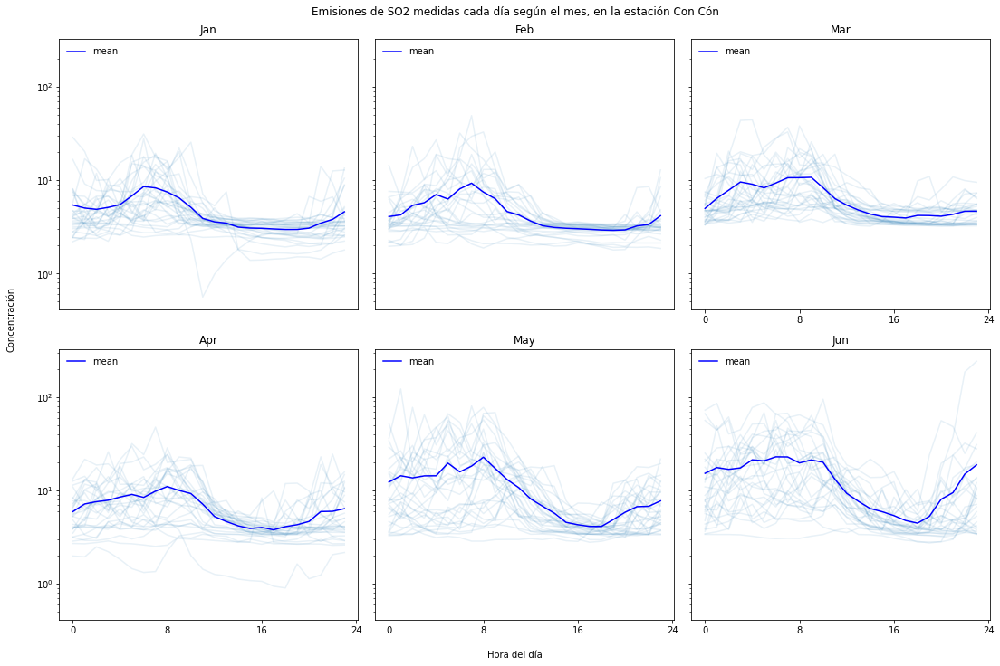

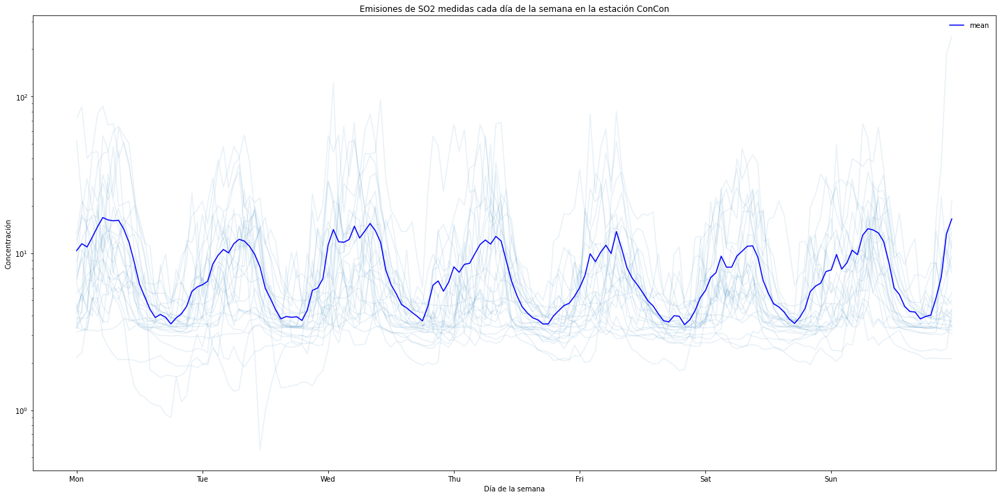

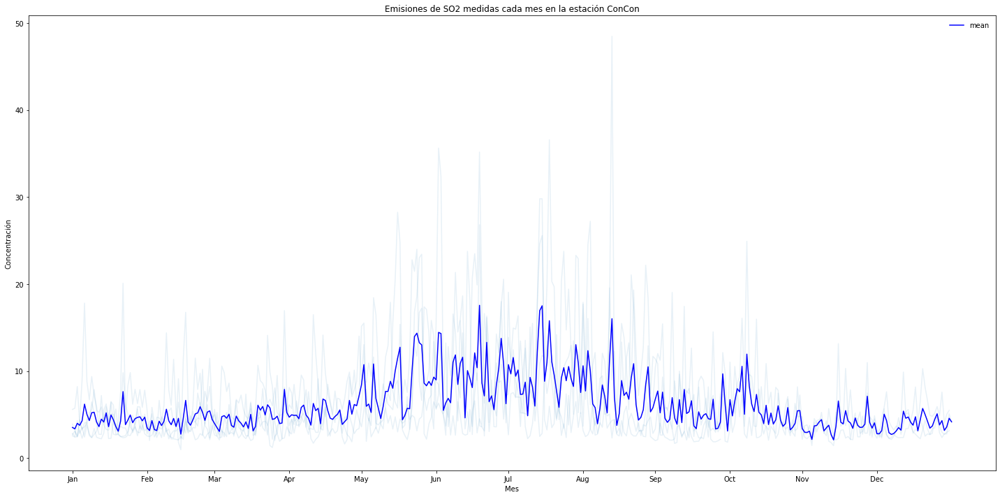

In [19]:
visualizar_trends(df_2anos, col = "SO2", ano_0=2019, log=True)

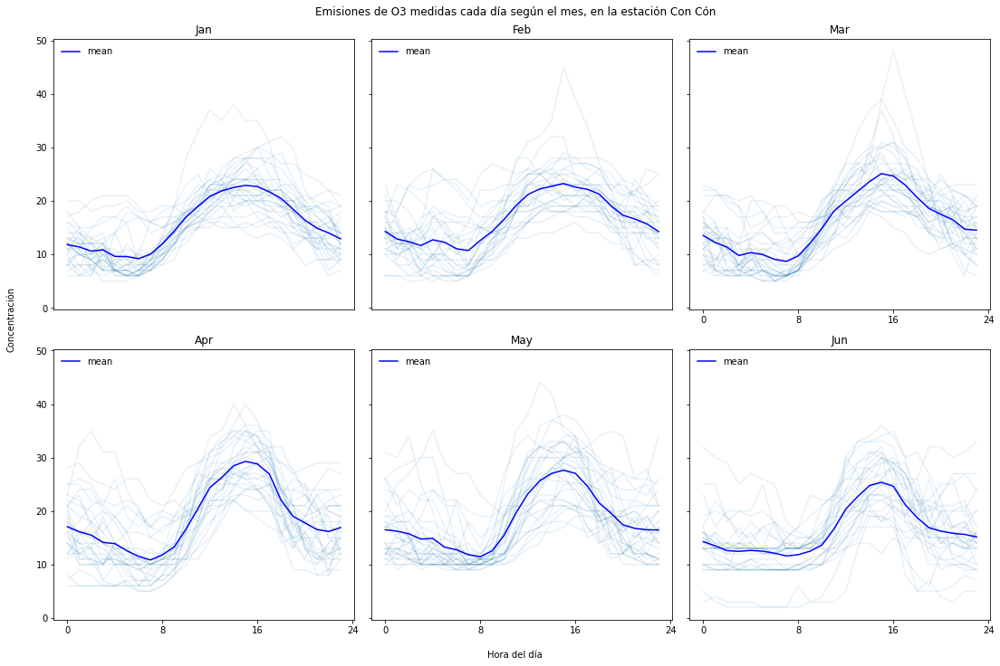

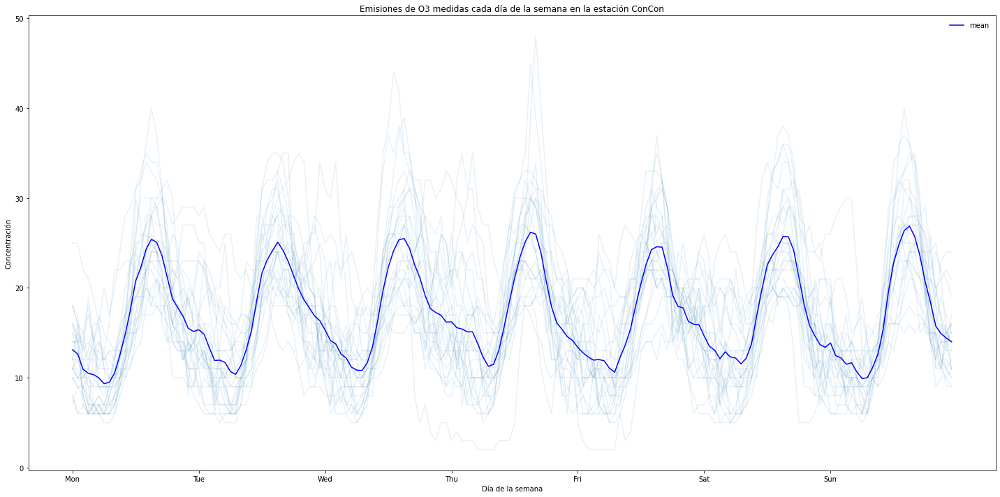

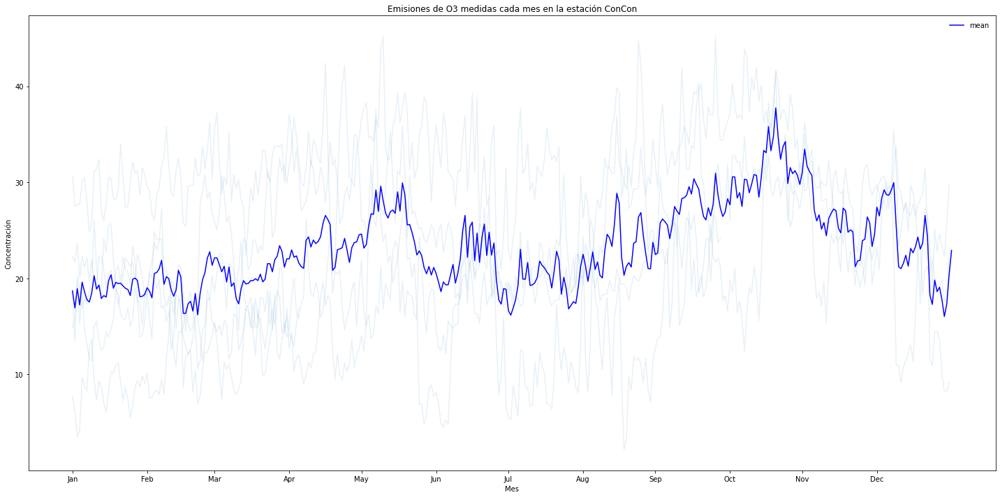

In [20]:
visualizar_trends(df_2anos, col = "O3", ano_0=2019)

In [21]:
import statsmodels.tsa.seasonal as Seasonal

In [22]:
STL = Seasonal.STL

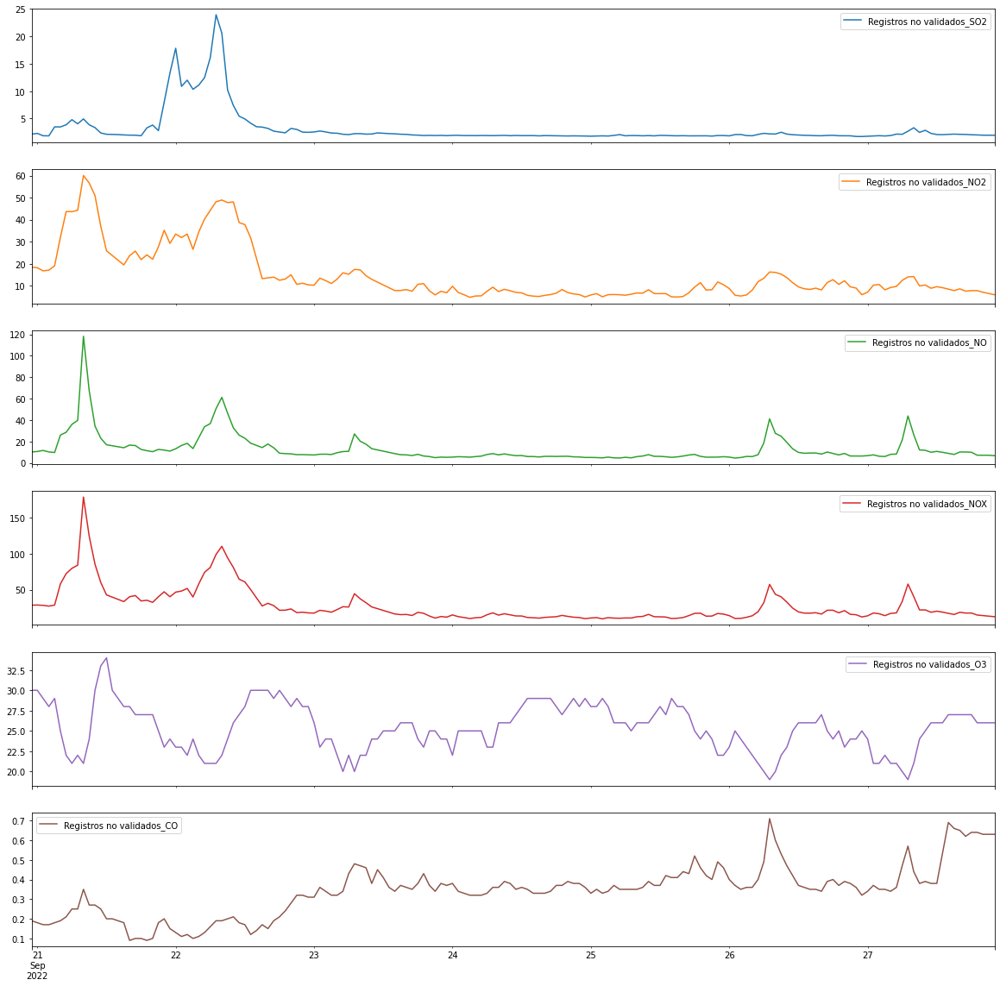

In [23]:
dataso = ver_ultima_semana(concon_df).rename(columns={"Registros no validados_SO2": "SO2", "Registros no validados_NO2": "NO2", "Registros no validados_NO": "NO", "Registros no validados_NOX": "NOX", "Registros no validados_O3": "O3", "Registros no validados_CO": "CO"})

In [24]:
dataso["day"] = dataso.index.day
dataso["month"] = dataso.index.month
dataso.groupby(["day", "month"]).mean()

,,SO2,NO2,NO,NOX,O3,CO
day,month,,,,,,
20,9,2.160000,18.430000,10.229300,28.657500,30.000000,0.190000
21,9,3.569167,30.805417,24.233394,55.038721,26.791667,0.188333
22,9,8.190000,28.381042,21.927432,50.307152,26.041667,0.185417
23,9,2.195833,11.040208,10.044926,21.085010,23.791667,0.380000
24,9,1.887500,6.607500,6.385980,12.993767,26.666667,0.352917
25,9,1.878333,7.020833,5.790633,12.811547,26.250000,0.394583
26,9,1.996667,10.258333,11.680745,21.937621,23.666667,0.410000
27,9,2.167826,9.154348,11.528079,20.683700,24.173913,0.497609


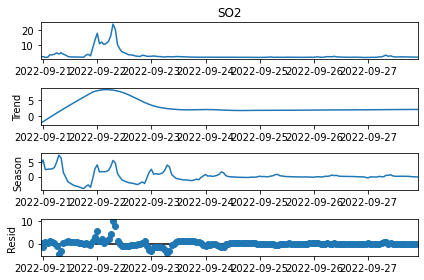

In [25]:
res = STL(dataso["SO2"]).fit()
res.plot()
plt.show()

# EDA Medium

In [26]:
concon_df = concon_df.rename(columns={"Registros no validados_SO2": "SO2", "Registros no validados_NO2": "NO2", "Registros no validados_NO": "NO", "Registros no validados_NOX": "NOX", "Registros no validados_O3": "O3", "Registros no validados_CO": "CO"})
concon_df

,SO2,NO2,NO,NOX,O3,CO
2017-09-27 18:00:00,1.32,9.01,7.99708,17.00820,22.0,0.66
2017-09-27 19:00:00,1.19,8.25,7.47957,15.72780,22.0,0.52
2017-09-27 20:00:00,1.21,6.56,5.00489,11.56530,23.0,0.56
2017-09-27 21:00:00,1.45,6.26,3.48237,9.73781,24.0,0.49
2017-09-27 22:00:00,4.04,4.97,3.07353,8.04764,25.0,0.48
...,...,...,...,...,...,...
2022-09-27 19:00:00,2.02,7.77,7.23187,15.00580,26.0,0.64
2022-09-27 20:00:00,1.97,7.04,7.23932,14.27470,26.0,0.63
2022-09-27 21:00:00,1.96,6.48,7.18593,13.66950,26.0,0.63
2022-09-27 22:00:00,1.96,5.91,6.80318,12.71370,26.0,0.63


In [27]:
concon_ma_df = get_minma_data(['velviento', 'temp', 'dirviento00'], 'concon', from_last=from_last, n_cols = 3)
concon_ma_df = concon_ma_df.rename(columns={"Unnamed: 2_velviento": "VelViento", "Unnamed: 2_temp": "Temperatura", "Unnamed: 2_dirviento00": "DirViento"})
concon_ma_df.head()

c:\users\nicol\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Units 'M', 'Y' and 'y' do not represent unambiguous timedelta values and will be removed in a future version
  """Entry point for launching an IPython kernel.


,VelViento,Temperatura,DirViento
2017-09-28 18:00:00,0.701297,12.9519,307.335
2017-09-28 19:00:00,0.189222,12.8652,341.265
2017-09-28 20:00:00,0.713454,12.6152,268.001
2017-09-28 21:00:00,0.835072,12.6785,248.214
2017-09-28 22:00:00,0.205688,12.8185,215.089


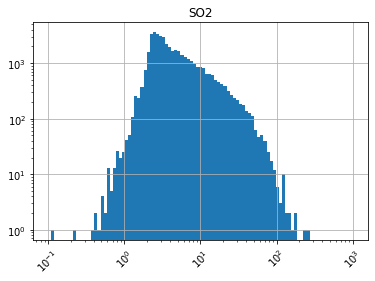

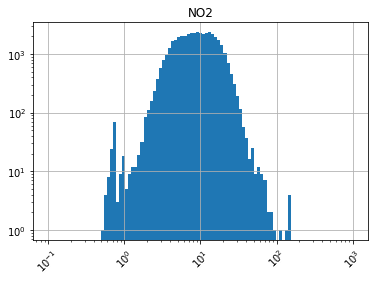

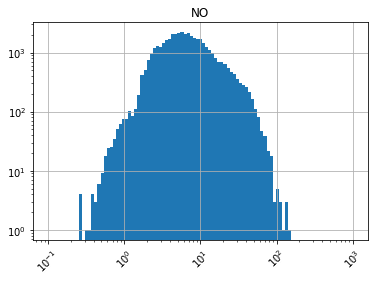

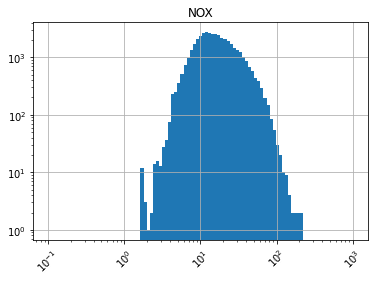

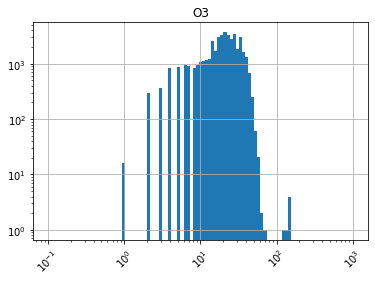

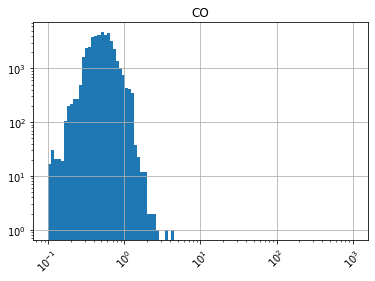

In [28]:
for col in ['SO2','NO2','NO','NOX', 'O3', 'CO']:
    concon_df.hist(col, bins = np.logspace(-1,3,100), log =True)
    #sns.countplot(concon_df[col])
    plt.title(col)
    plt.xscale("log")
    plt.xticks(rotation=45)
    plt.show()

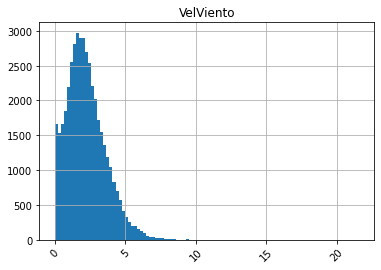

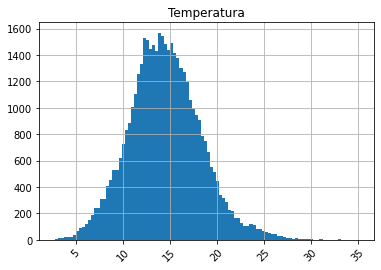

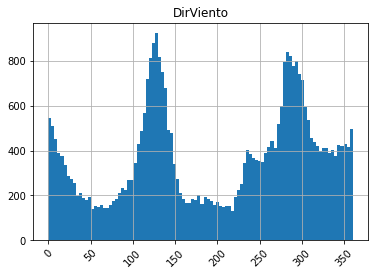

In [29]:
for col in ['VelViento','Temperatura','DirViento']:
    concon_ma_df.hist(col, bins = 100)
    #sns.countplot(concon_df[col])
    plt.title(col)
    plt.xticks(rotation=45)
    plt.show()

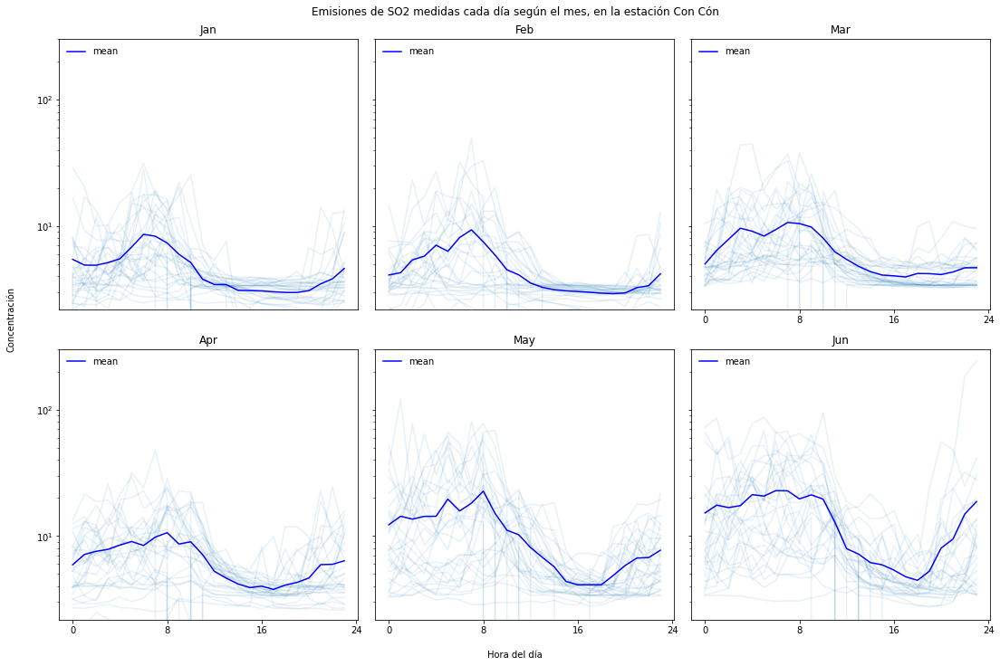

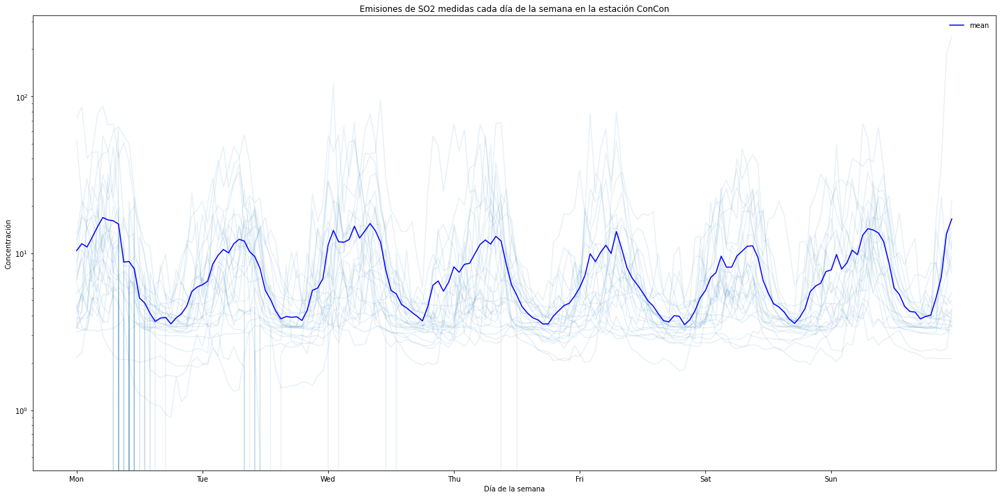

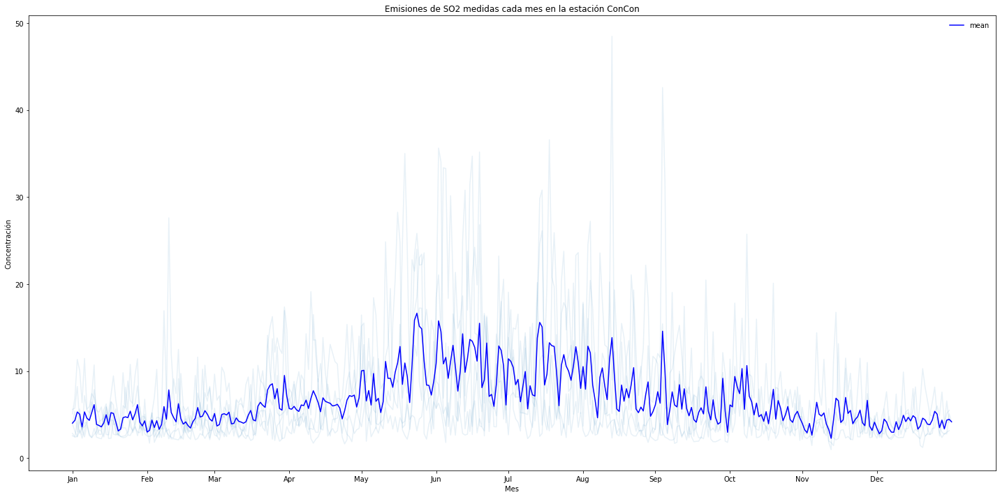

In [30]:
visualizar_trends(concon_df, col = "SO2", ano_0=2019, log = True)

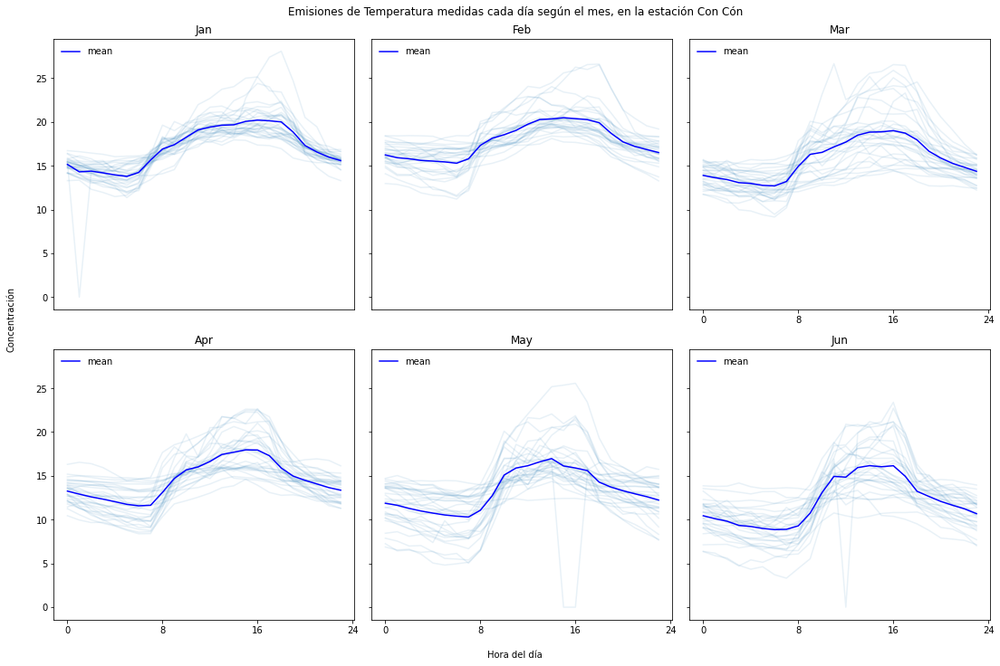

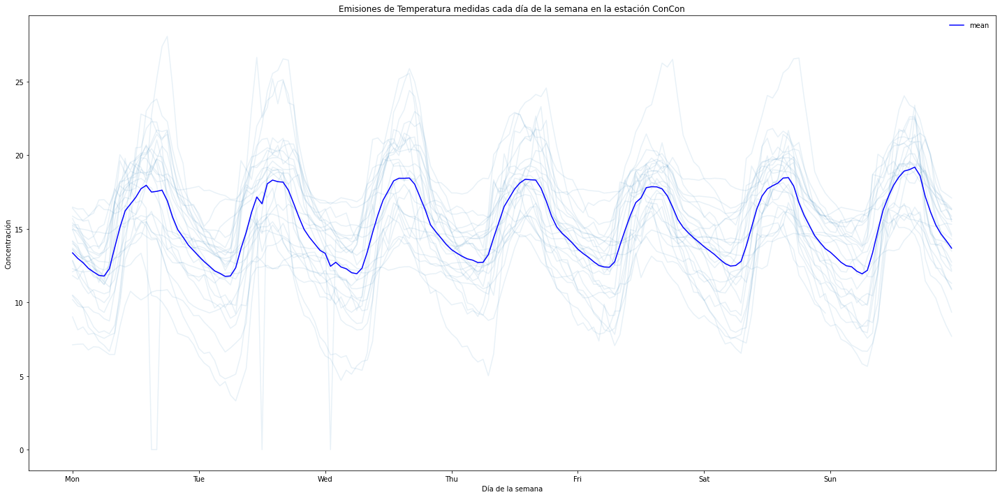

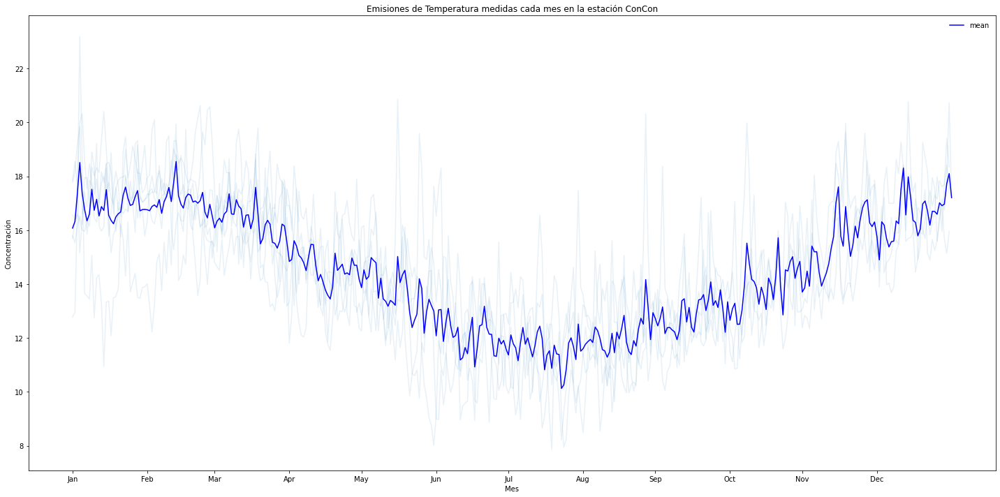

In [31]:
visualizar_trends(concon_ma_df, col = "Temperatura", ano_0=2019)

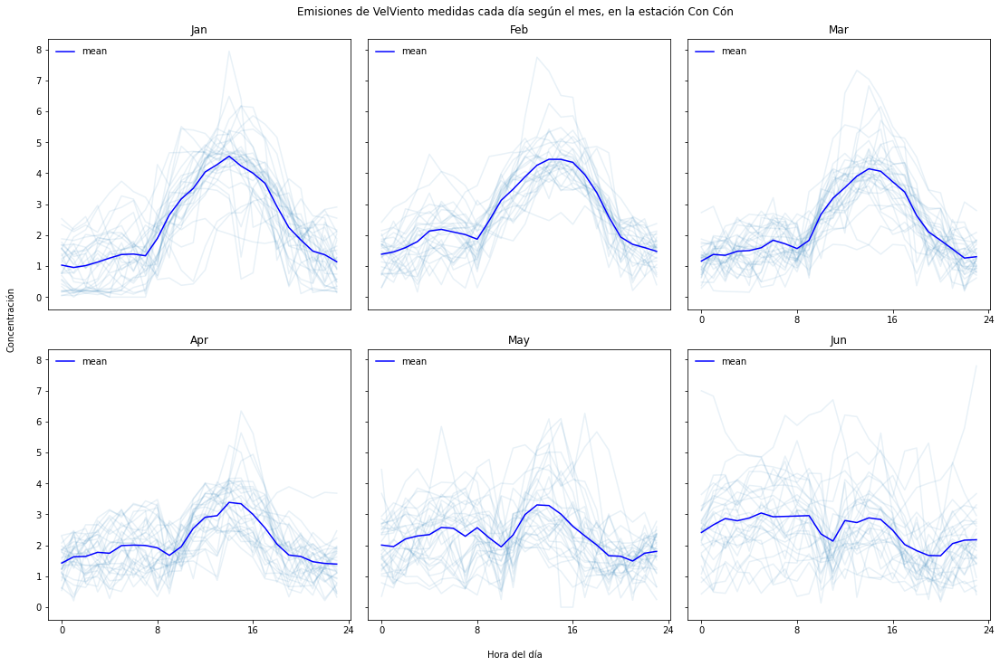

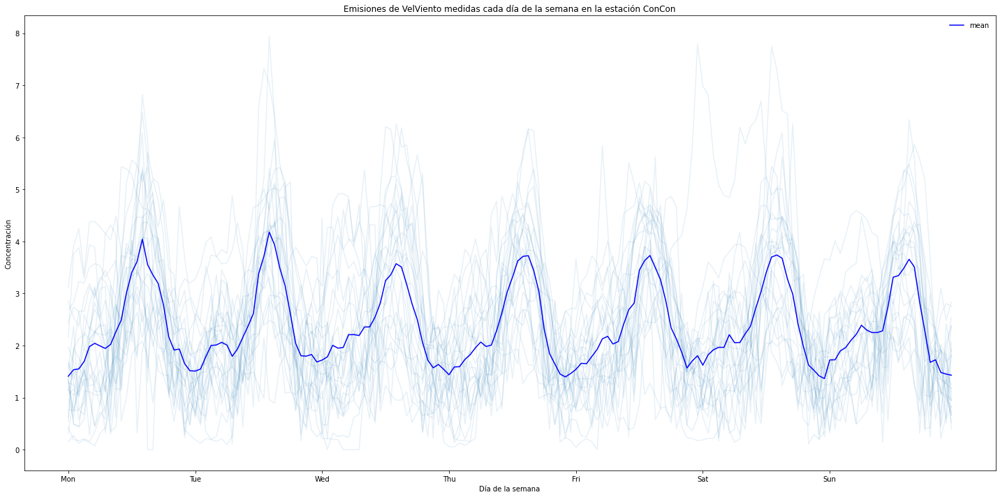

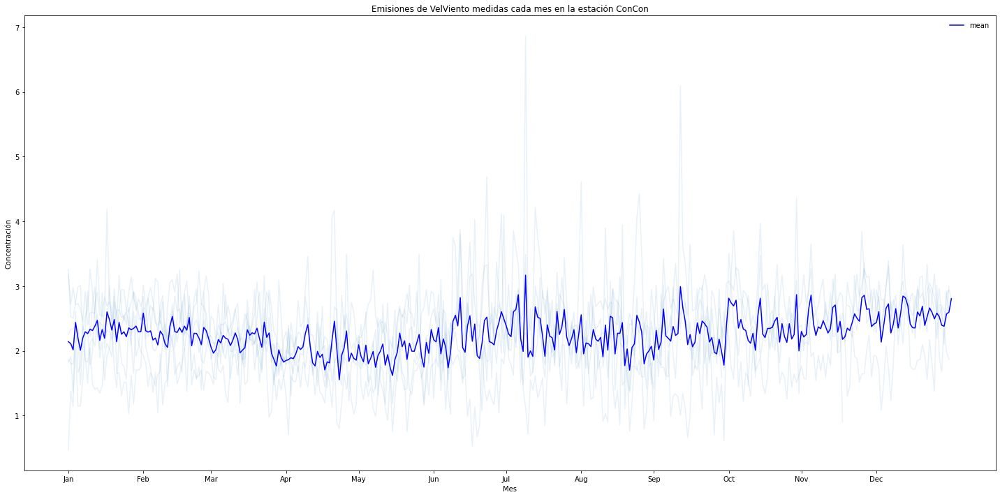

In [32]:
visualizar_trends(concon_ma_df, col = "VelViento", ano_0=2019)

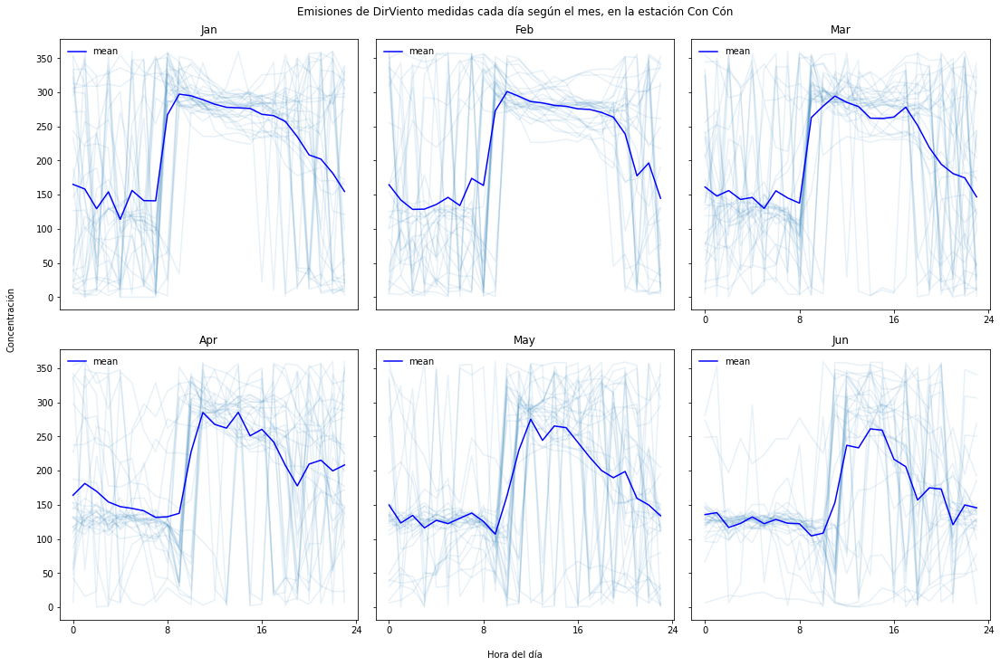

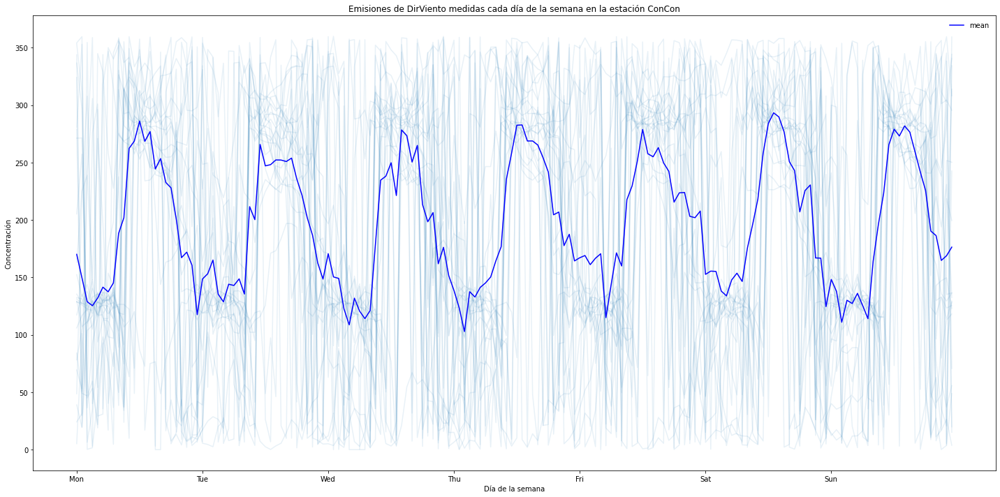

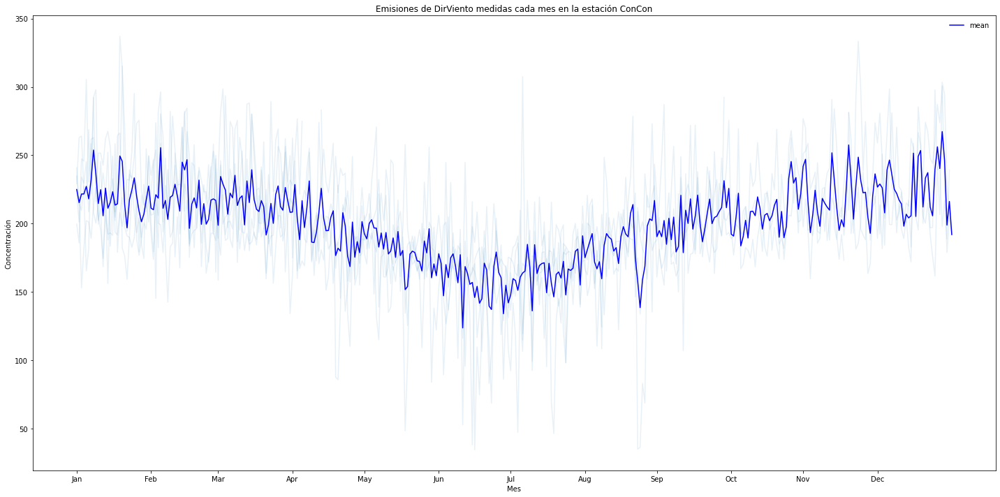

In [33]:
visualizar_trends(concon_ma_df, col = "DirViento", ano_0=2019, circular = False)

c:\users\nicol\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


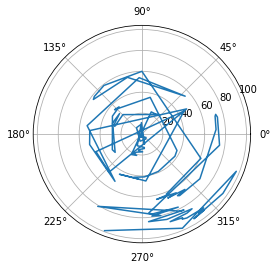

In [34]:
aaa = concon_ma_df.iloc[-100:]
aaa['rad'] = aaa.apply(lambda row: row.DirViento*np.pi/180, axis=1)
plt.polar(aaa['rad'], range(len(aaa.values))) #aaa["VelViento"])
#concon_ma_df


In [35]:
import plotly.express as px
import plotly.graph_objects as go

fig = go.Figure()
trace1 = px.line_polar(theta=aaa["DirViento"], r=range(len(aaa.values)))
trace2 = px.scatter_polar(theta=aaa["DirViento"], r=range(len(aaa.values)), color=range(len(aaa.values)), color_continuous_scale='hot')

fig.add_trace(trace1.data[0])
fig.add_trace(trace2.data[0])

#fig = px.scatter_polar(df, r="frequency", theta="direction")
fig.show()

In [36]:
concon_ma_df["VelViento"].apply(lambda x: np.mean(x), axis = 1)

TypeError: <lambda>() got an unexpected keyword argument 'axis'

## Ventanas